In [1]:
import matplotlib.pyplot as plt
import pandas as pd

import json
import os
import cv2
import imgaug
import keras_ocr

In [4]:
# df = pd.read_csv('../data/craft/train/craft/recognizer_registrationtext.csv')
# df.head()
# ax = plt.gca()

# df.plot(kind='line',x='epoch',y='loss',color='blue',ax=ax)
# df.plot(kind='line',x='epoch',y='val_loss', color='orange', ax=ax)
# plt.xticks(df.epoch)
# plt.show()

In [5]:
#initialize model

with open('../data/registrationtext/label/character_label_decoder.json') as file:
    decoder = json.load(file)
    
recognizer_alphabet = ''.join(decoder.values())
recognizer = keras_ocr.recognition.Recognizer(
    alphabet=recognizer_alphabet,
    weights='kurapan'
)
recognizer.include_top = True
recognizer.compile()
for layer in recognizer.backbone.layers:
    layer.trainable = False

Instructions for updating:
Create a `tf.sparse.SparseTensor` and use `tf.sparse.to_dense` instead.
Provided alphabet does not match pretrained alphabet. Using backbone weights only.
Looking for C:\Users\ammar\.keras-ocr\crnn_kurapan_notop.h5


In [6]:
detector = keras_ocr.detection.Detector()

Looking for C:\Users\ammar\.keras-ocr\craft_mlt_25k.h5


In [7]:
#load model
checkpoint_folder = '../data/craft/train/craft/checkpoints/'
recognizer.model.load_weights(f'{checkpoint_folder}recognizer_registrationtext.h5')
model = keras_ocr.pipeline.Pipeline(detector=detector, recognizer=recognizer)


In [8]:
"""
0AE0w225302
0aFwo180206
0aHh6140455
0Az03155932
0bPuP125207
""".replace('\n','.jpg\',\'')

".jpg','0AE0w225302.jpg','0aFwo180206.jpg','0aHh6140455.jpg','0Az03155932.jpg','0bPuP125207.jpg','"

In [9]:
old_format = ['0a6Zo103616.jpg','0a92N114012.jpg','0AdO3123028.jpg','0eh3o175733.jpg','0GbL5173658.jpg']
new_format = ['0AE0w225302.jpg','0aFwo180206.jpg','0aHh6140455.jpg','0Az03155932.jpg','0bPuP125207.jpg']

#Get text images
# IMAGE_NUM = 1
# IMAGES = os.listdir('../data/registrationregion/img')
# images = [cv2.imread(f'../data/registrationregion/img/{image}') for image in images]

old_images = [cv2.imread(f'../data/registrationregion/img/{image}') for image in old_format]
# old_images = [cv2.copyMakeBorder( image , 0, 0, 0, image.shape[1], cv2.BORDER_CONSTANT,value=[255,255,255]) for image in old_images] 
new_images = [cv2.imread(f'../data/registrationregion/img/{image}') for image in new_format]


In [11]:
%%time
old_pg = model.recognize(old_images)

Wall time: 4min 22s


In [239]:
def sort_prediction(textboxes, image):
    height = image.shape[0]
    y_gap = 50
    predictions = textboxes.copy()
    container = []
    for pixel in range(y_gap, height, y_gap):
        temp_predictions = []
        for prediction in predictions:
            y1 = min(prediction[1][:,1])
            y2 = max(prediction[1][:,1])
            mid_y = ((y1+ y2) /2)
            if pixel-y_gap <= mid_y < pixel:
                temp_predictions.append(prediction)
        #sort x
        pred_len = len(temp_predictions)
        iteration = pred_len - 1
        for i in range(0, pred_len):
            for j in range(0, iteration-i):
                x1 = min(temp_predictions[j][1][:,0])
                x2 = max(temp_predictions[j][1][:,0])
                mid_x = ((x1+ x2)/2)

                next_x1 = min(temp_predictions[j+1][1][:,0])
                next_x2 = max(temp_predictions[j+1][1][:,0])
                next_mid_x = ((next_x1+next_x2) / 2 )
                if mid_x > next_mid_x:
                    temp = temp_predictions[j]
                    temp_predictions[j] = temp_predictions[j+1]
                    temp_predictions[j+1] = temp
            
        container = container + temp_predictions
#     pred_len = len(predictions)
#     iteration = pred_len - 1
#     for i in range(0, pred_len):
#         for j in range(0, iteration-i):
#             x1 = min(predictions[j][1][:,0])
#             x2 = max(predictions[j][1][:,0])
#             mid_x = ((x1+ x2)/2)

#             next_x1 = min(predictions[j+1][1][:,0])
#             next_x2 = max(predictions[j+1][1][:,0])
#             next_mid_x = ((next_x1+next_x2) / 2 )
#             if mid_x > next_mid_x:
#                 temp = predictions[j]
#                 predictions[j] = predictions[j+1]
#                 predictions[j+1] = temp

#         for j in range(0, iteration-i):
#             y1 = min(prediction[j][1][:,1])
#             y2 = max(prediction[j][1][:,1])
#             mid_y = ((y1+ y2) /2)

#             next_y1 = min(prediction[j+1][1][:,1])
#             next_y2 = max(prediction[j+1][1][:,1])
#             next_mid_y = ( (next_y1+next_y2) / 2)
#             if mid_y > next_mid_y:
#                 temp = prediction[j]
#                 prediction[j] = prediction[j+1]
#                 prediction[j+1] = temp
    return container
sort_prediction(old_pg[index], old_images[index])

[('NO.', array([[626.3739  ,  15.727987],
         [684.2918  ,  19.134924],
         [682.4455  ,  50.52213 ],
         [624.52765 ,  47.115192]], dtype=float32)),
 ('PENDAFTABAN:', array([[699.58594 ,  18.410156],
         [952.7256  ,  18.410156],
         [952.7256  ,  50.62793 ],
         [699.58594 ,  50.62793 ]], dtype=float32)),
 ('WC5694U', array([[1041.708   ,   13.807617],
         [1302.5186  ,   13.807617],
         [1302.5186  ,   67.50391 ],
         [1041.708   ,   67.50391 ]], dtype=float32)),
 ('Nama', array([[226.04286, 161.48035],
         [322.00317, 167.12506],
         [320.2415 , 197.07332],
         [224.28119, 191.42859]], dtype=float32)),
 ('Pemunya', array([[330.31317, 161.58415],
         [470.58823, 169.06546],
         [468.87375, 201.21225],
         [328.5987 , 193.73093]], dtype=float32)),
 ('Berdaftar', array([[225.64034, 206.7602 ],
         [379.36545, 209.50531],
         [378.79276, 241.57588],
         [225.06764, 238.83076]], dtype=float32)),
 (

In [240]:
' '.join([ word for word,box in old_pg[1]])

'PENDAFTABAN: WC5694U NO. Alamat Berdaftar Pemunya Nama 2016 V 1.8L HONDA PERSENDIRIAN-MOTOKAR INDIVIDU PMHRU5870GD7075 PUTIH No. R18ZG7800760 Enjin PERSENDIRIAN No. Kegunaan Buatan 28/05/2016 Pendaftaran Casis Pemunya Kelas Bahan arna 12 bulan Status Motor Model Tempat Nama Muatan Dibuat Tahun Jenis Tarikh Bakar Kenderaan Kadar Keupayaan Duduk Badan 6 Lesen bulan 1799 Enjin MOTOKAR PETROL HR-V 5'

In [241]:
index = 1
sorted_pred = sort_prediction(old_pg[index], old_images[index])
' '.join([ word for word,box in sorted_pred])

'NO. PENDAFTABAN: WC5694U Nama Pemunya Berdaftar Alamat No. Enjin R18ZG7800760 No. Casis PMHRU5870GD7075 Buatan HONDA Nama Model HR-V 1.8L V Keupayaan Enjin 1799 Bahan Bakar PETROL arna PUTIH Kelas Kegunaan PERSENDIRIAN-MOTOKAR INDIVIDU Jenis Badan MOTOKAR Tahun Dibuat 2016 Tarikh Pendaftaran 28/05/2016 Status Pemunya PERSENDIRIAN Muatan Tempat Duduk 5 Kadar Lesen Kenderaan Motor 6 bulan 12 bulan'

In [227]:
old_images[0].shape

(1397, 1612, 3)

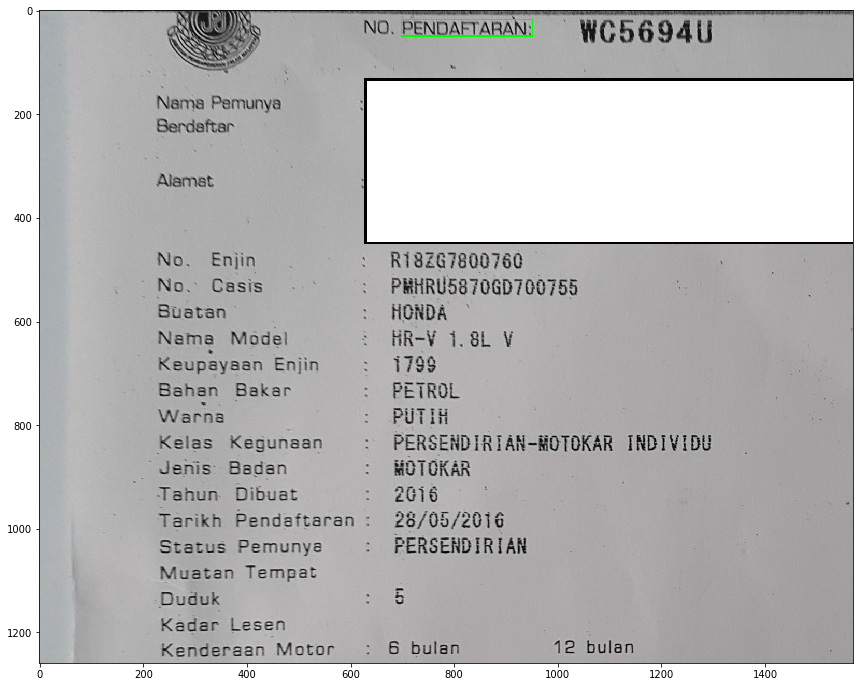

In [228]:
index = 1
sample_label = old_pg[index][0][1]

x1 = min(sample_label[:,0])
x2 = max(sample_label[:,0])
y1 = min(sample_label[:,1])
y2 = max(sample_label[:,1])

sample_img = old_images[index].copy()
sample_img = cv2.rectangle(sample_img, (x1,y1),(x2,y2),(0,255,0),2)
plt.figure(figsize=(16,12))
plt.imshow(sample_img)

In [15]:
%%time
new_pg = model.recognize(new_images)

Wall time: 3min 36s


In [33]:
{imgname:' '.join([c for c,_ in prediction]) for imgname,prediction in zip(old_format, old_pg)}

{'0a6Zo103616.jpg': 'PENOAFTARAN NO IiKM58 12 Pemunya Nama Berdaftar Alamat Enjin No CAY44 764 Casis NoO WVMZ7Z6RZCY23 1623 Buatan VOL KSNAGEN Model Nama POL 0 1.4 Enjin Keupayaan 1390 S.P Bahan Bakar PETROL PUTIH MYarna Kelas Kegunaan PERSE ND IRIAN: MOTOKAR SYARIKAT Jenis Badan MOTOKAR Tahun Dibuat 2012 Pendaftaran Tarikh 01/03 /2013 Status Pemunya SARIKATPERTARUAN Tempat Muatan Duduk Kadar Lesen 12 bulan 6 bulan Kenderaan Motor 40. 00 RM70. 00 RM 1',
 '0a92N114012.jpg': 'NO MC5694U PENDAFTARAN: Nama Pemunya Berdaftar Aamat Enjin R187G780 760 No PMHRU5870GD70075 No. Casis Buatan HONDA Nama Model HR-V 1 8L N Enjin 179 Keupayaan PETROL Bahan Bakar PUTIH Mparna PERSEND IRIAN-MOTOKAR INDIVIDU Kelas Kegunaan MOTOKAR Jenis Badan Tahun Dibuat 2016 28/05/2016 Pendaftaran Tarikh PERSENDIRIAN Status Pemunya Muatan Tempat 5 Duduk Kadar Lesen 12 6 bulan bulan Motor Kenderaan',
 '0AdO3123028.jpg': 'KEND PENDAFTARAN PERAKUAN I5r JRE6515 NO. PENDAFTARAN: Pemunya ama erdaftar amat B. D G4NDEHO70256 

In [16]:
{imgname:' '.join([c for c,_ in prediction]) for imgname,prediction in zip(new_format, new_pg)}

{'0AE0w225302.jpg': 'MPS6028 Pendaftaran No 654188-H ND No. BERHAD ABLEGROUP Berdaftar Nama Pemdnya JLN MENARA WELD 76 11 LVL SUITE 1A 11. Alamat LUMPUR KUALA PERSEKUTUAN WILAYAH LUMPUR 50200 KUALA 7923 2AZE01 MRO53BK40704802 No. Chas is/No Enjin ACV40R-JEAGKE KAO CAMRY 2 4 TOYOTA Buatan/Nama Model 2362 Keupayaan Enjin PETROL Bakar Bahan IMPORT BARU KENDERAAN Status Asal IRIAN-MOTOKAR SYAR IKAT PERSEND Kelas Kegunan MOTOKAR 2006 / Badan/Tahun Dibuat Jenis 10/01 /2007 Pendaftaran Tarikh K/BTM G. B.D. M/B. Pendaftaran SYarat 1 SYarat Pendaftaran 2',
 '0aFwo180206.jpg': 'JABATAN PENGANGKUTAN JALAN No Penda taran NK9896 No ID Pemunya Nama Berdaftar A 1 amat 1NZY359436 PN153HY9307121215 7 Chasis/No. Enj in No ATD 5 VIOS I TOYOTA TOYOTA / Buatan/Nama Model 1497 Enjin eupayaan PETROL Bakar lahan TEPATAN PEMASANGAN Asal itatus INDIVIDU PERSENDIRIAN-MOTOKAR Kegunaan lelas 2011 MOTOKAR Dibuat Badan/Tahun ienis 8/09/2011 Pendaftaran arikh K/BTM G M/B. B.D Pendaftaran Yyarat',
 '0aHh6140455.jpg': 

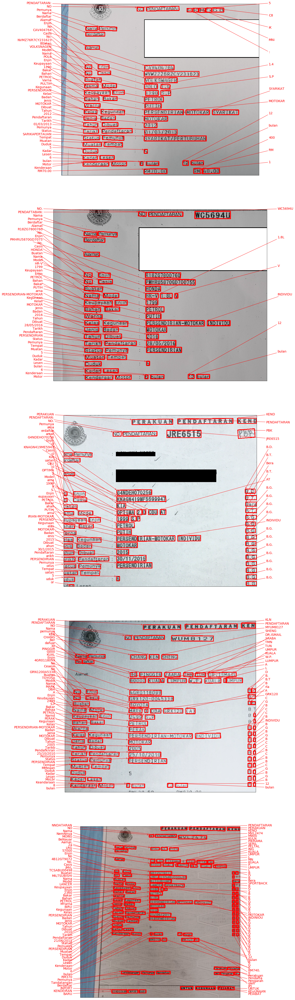

In [50]:
#  Plot the predictions
fig, axs = plt.subplots(nrows=len(old_images), figsize=(40,80))
for ax, image, predictions in zip(axs, old_images, old_pg):
    keras_ocr.tools.drawAnnotations(image=image, predictions=predictions, ax=ax)

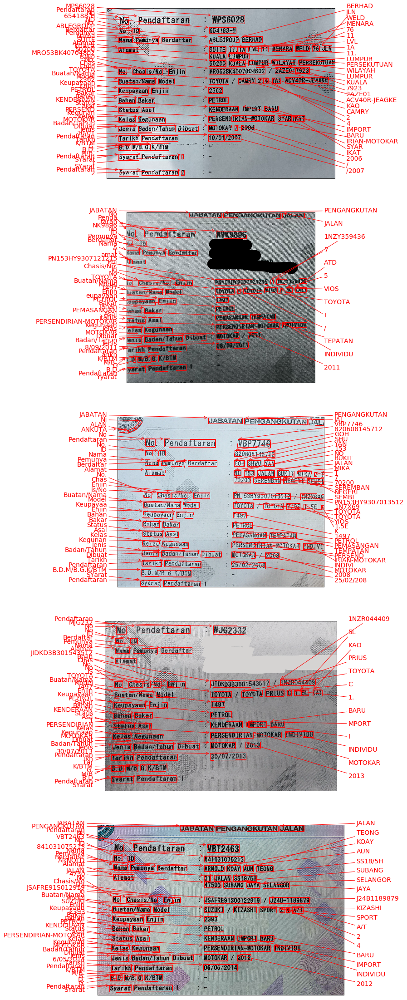

In [21]:
#  Plot the predictions
fig, axs = plt.subplots(nrows=len(new_images), figsize=(40,40))
for ax, image, predictions in zip(axs, new_images, new_pg):
    keras_ocr.tools.drawAnnotations(image=image, predictions=predictions, ax=ax)

In [10]:
detector = keras_ocr.detection.Detector()

Looking for C:\Users\ammar\.keras-ocr\craft_mlt_25k.h5


In [40]:
%%time
detections = detector.detect(old_images,
                            detection_threshold=0.7,
                               text_threshold=0.4,
                               link_threshold=0.2,
                               size_threshold=10)

Wall time: 1min 30s


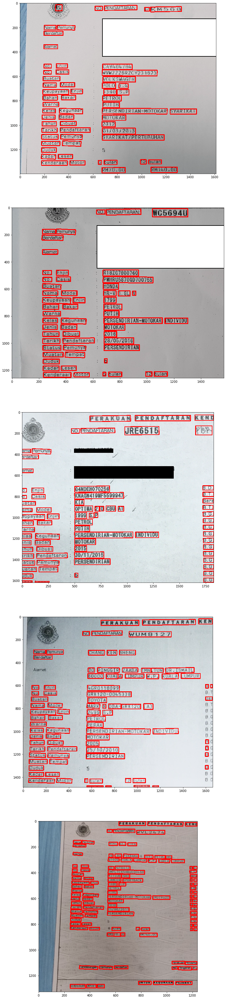

In [42]:
#  Plot the predictions
fig, axs = plt.subplots(nrows=len(old_images), figsize=(60, 60))
for ax, image, boxes in zip(axs, old_images, detections):
    ax.imshow(keras_ocr.tools.drawBoxes(image=image, boxes=boxes))

In [16]:
augmenter = imgaug.augmenters.Sequential([
    imgaug.augmenters.GammaContrast(gamma=(0.25, 3.0)),
])

In [17]:
images_aug = augmenter(images=images)

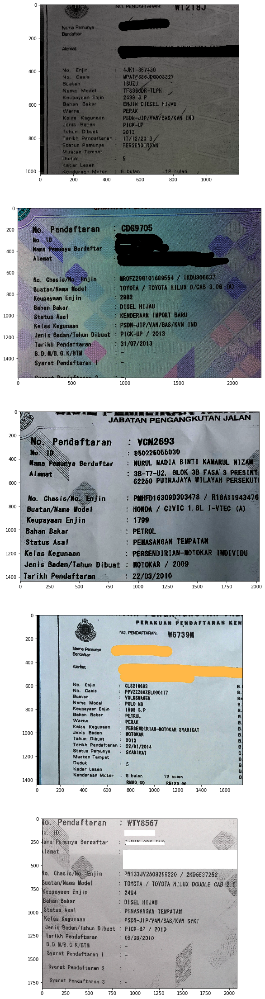

In [18]:
fig, axs = plt.subplots(nrows=len(images), figsize=(40, 40))
for ax, image in zip(axs,images_aug):
    ax.imshow(image)

In [4]:
"""PERAKUAN PENDATARAN KEND NO PNNDAFTAAN MML24 7 Nama Nemunya NNONG MWAIL KULN eerNamuar ALamL 2a RG PIKRAMA SERIL PETAL ING 57000 KUALA LUMPUR MN.P KUAL UMPUR A L No Enjin 4B 2GT9072 D B No Casis JMF LTCKSABU000498 B T Buatan MILTS IUBLSHI Bera Nama Model LANCER SPORTBACK B Keupayaan Enjin 2360 B S P G Bahan Bakar PETROL B G MYarna B G BIRU Kelas Kegunaan PE RSENDIRIAN B G MOTOKAR INDINITOU Janis Badan B G MOTOKAR Tahun Dpibuat B G 2010 Tarikh Pendaftaran B G /6/2011 21 Statua Pemunya G B PERSENDIRI AN Muatan TempaL B G puduk B G Kadar Lesan B G Kenderaan Motor bulan 12 bulan B G RM3 70 00 RM740. 00 Perakuan Pendafta Tandaangan Pemunya Berdaftar oleh Pengarah JPJ KEGUNAAN UNTUK PEIABAT IENDLIAAN INPOKT BAIU""".upper()

'PERAKUAN PENDATARAN KEND NO PNNDAFTAAN MML24 7 NAMA NEMUNYA NNONG MWAIL KULN EERNAMUAR ALAML 2A RG PIKRAMA SERIL PETAL ING 57000 KUALA LUMPUR MN.P KUAL UMPUR A L NO ENJIN 4B 2GT9072 D B NO CASIS JMF LTCKSABU000498 B T BUATAN MILTS IUBLSHI BERA NAMA MODEL LANCER SPORTBACK B KEUPAYAAN ENJIN 2360 B S P G BAHAN BAKAR PETROL B G MYARNA B G BIRU KELAS KEGUNAAN PE RSENDIRIAN B G MOTOKAR INDINITOU JANIS BADAN B G MOTOKAR TAHUN DPIBUAT B G 2010 TARIKH PENDAFTARAN B G /6/2011 21 STATUA PEMUNYA G B PERSENDIRI AN MUATAN TEMPAL B G PUDUK B G KADAR LESAN B G KENDERAAN MOTOR BULAN 12 BULAN B G RM3 70 00 RM740. 00 PERAKUAN PENDAFTA TANDAANGAN PEMUNYA BERDAFTAR OLEH PENGARAH JPJ KEGUNAAN UNTUK PEIABAT IENDLIAAN INPOKT BAIU'